1. Analyze and Preprocess data - Check if the dataset has missing values or has any other problem.
2. Feature Engineering
3. Sampling Your Data
4. Build Model
    4. a. Try DecisionTree, RandomForest
    4. b. Try other tree-based model like: XGBoost, CatBoost
5. Perform model on training set and test set using gridsearch CV
6. Measure performance of the model.
7. Which metric is your main metric for this problem and why? What is your main model as well as their params and why?


How can I measure your point:
1. Your function is callable and runs correctly
2. The performance of your model (in full pipeline) is acceptable.
3. The data preprocessing is correct or make sense
4. The Feature engineering is correct or make sense
5. Any other additional process will be considered a small plus point.

Churn rate is a marketing metric that describes the number of customers who leave a business over a specific time period. Every user is assigned a prediction value that estimates their state of churn at any given time. This value is based on:

User demographic information
Browsing behavior
Historical purchase data among other information
It factors in our unique and proprietary predictions of how long a user will remain a customer. This score is updated every day for all users who have a minimum of one conversion. The values assigned are between 1 and 5.

# Load Dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount("/content/drive")

import warnings
warnings.filterwarnings("ignore", message="Your warning message here")

Mounted at /content/drive


In [2]:
df = pd.read_csv("/content/drive/MyDrive/Dataset /Machine Learning/HomeWork-churn_rate_prediction.csv")
print(df.shape)
df.head()

(36992, 25)


,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,fffe4300490044003600300030003800,Pattie Morrisey,18,F,XW0DQ7H,Village,Platinum Membership,2017-08-17,No,xxxxxxxx,...,300.63,53005.25,17.0,781.75,Yes,Yes,No,Not Applicable,Products always in Stock,2
1,fffe43004900440032003100300035003700,Traci Peery,32,F,5K0N3X1,City,Premium Membership,2017-08-28,?,CID21329,...,306.34,12838.38,10.0,NaN,Yes,No,Yes,Solved,Quality Customer Care,1
2,fffe4300490044003100390032003600,Merideth Mcmeen,44,F,1F2TCL3,Town,No Membership,2016-11-11,Yes,CID12313,...,516.16,21027.00,22.0,500.69,No,Yes,Yes,Solved in Follow-up,Poor Website,5
3,fffe43004900440036003000330031003600,Eufemia Cardwell,37,M,VJGJ33N,City,No Membership,2016-10-29,Yes,CID3793,...,53.27,25239.56,6.0,567.66,No,Yes,Yes,Unsolved,Poor Website,5
4,fffe43004900440031003900350030003600,Meghan Kosak,31,F,SVZXCWB,City,No Membership,2017-09-12,No,xxxxxxxx,...,113.13,24483.66,16.0,663.06,No,Yes,Yes,Solved,Poor Website,5


# EDA & Preprocessing

## Exploratory Data Analysis

Before get into detail each features, let's see how this dataset perform generally

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36992 entries, 0 to 36991
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   customer_id                   36992 non-null  object 
 1   Name                          36992 non-null  object 
 2   age                           36992 non-null  int64  
 3   gender                        36992 non-null  object 
 4   security_no                   36992 non-null  object 
 5   region_category               31564 non-null  object 
 6   membership_category           36992 non-null  object 
 7   joining_date                  36992 non-null  object 
 8   joined_through_referral       36992 non-null  object 
 9   referral_id                   36992 non-null  object 
 10  preferred_offer_types         36704 non-null  object 
 11  medium_of_operation           36992 non-null  object 
 12  internet_option               36992 non-null  object 
 13  l

In [ ]:
df.isnull().sum()

customer_id                        0
Name                               0
age                                0
gender                             0
security_no                        0
region_category                 5428
membership_category                0
joining_date                       0
joined_through_referral            0
referral_id                        0
preferred_offer_types            288
medium_of_operation                0
internet_option                    0
last_visit_time                    0
days_since_last_login              0
avg_time_spent                     0
avg_transaction_value              0
avg_frequency_login_days           0
points_in_wallet                3443
used_special_discount              0
offer_application_preference       0
past_complaint                     0
complaint_status                   0
feedback                           0
churn_risk_score                   0
dtype: int64

some features have missing values but I will handle with missing values when I deeply get into each features. Cause some features have values like 'xxxxxx', 'Error', 'Unknown', and so on still perform as actual values but it represent as missing(or error) values

In [ ]:
df.describe()

,age,days_since_last_login,avg_time_spent,avg_transaction_value,points_in_wallet,churn_risk_score
count,36992.000000,36992.000000,36992.000000,36992.000000,33549.000000,36992.000000
mean,37.118161,-41.915576,243.472334,29271.194003,686.882199,3.463397
std,15.867412,228.819900,398.289149,19444.806226,194.063624,1.409661
min,10.000000,-999.000000,-2814.109110,800.460000,-760.661236,-1.000000
25%,23.000000,8.000000,60.102500,14177.540000,616.150000,3.000000
50%,37.000000,12.000000,161.765000,27554.485000,697.620000,4.000000
75%,51.000000,16.000000,356.515000,40855.110000,763.950000,5.000000
max,64.000000,26.000000,3235.578521,99914.050000,2069.069761,5.000000


days_since_last_login and avg_time_spent's distribution maybe skew as much as different between mean and median

point_in_wallet has some missing values

some features have min values is negative far from there percentiles and it must be outliers

also max of avg_transaction_value and point_in_wallet may be outliers

In [ ]:
df.describe(include = ['object'])

,customer_id,Name,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,preferred_offer_types,medium_of_operation,internet_option,last_visit_time,avg_frequency_login_days,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback
count,36992,36992,36992,36992,31564,36992,36992,36992,36992,36704,36992,36992,36992,36992,36992,36992,36992,36992,36992
unique,36992,36992,3,36992,3,6,1096,3,11359,3,4,3,30101,1654,2,2,2,5,9
top,fffe4300490044003600300030003800,Pattie Morrisey,F,XW0DQ7H,Town,Basic Membership,2015-06-02,No,xxxxxxxx,Gift Vouchers/Coupons,Desktop,Wi-Fi,07:56:41,Error,Yes,Yes,No,Not Applicable,Poor Product Quality
freq,1,1,18490,1,14128,7724,55,15839,17846,12349,13913,12413,6,3522,20342,20440,18602,18602,6350


Dataset not good as much cause some features have wrong types. For example:

Features like "joining_date" or "last_visit_time" is datetime type but some error values perform it as object type

What is 3rd gender ? maybe it represent by error values

region_category has some missing values

referral_id have a lot of error values 'xxxxxx'

Feedback has only 9 distinct content ? does it really affect churn rate if we encode it ?

No duplicated values

In [ ]:
df[df.duplicated()]

,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score


Now lets check more detail each features combine with tool EDA: Pandas Profiling

In [ ]:
!pip3 install pandas-profiling

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(
    df, title="Pandas Profiling Report dataset"
)
profile.to_notebook_iframe()

<ipython-input-5-f4d63e4c4d6a>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Customer_id, Name, Security_No: without any missing values, these features has plausible values, each customer must have their own unique ID. But the problem is they are text and how to handle all 37k (100%) unique values ? 

In [ ]:
df['customer_id'].value_counts().max(), df['Name'].value_counts().max()

(1, 1)

Age, Internet_option, used_special_discount, offer_application_preference, past_complaint, complaint_status, feedback are good, no unreasonable values like infinte, 0 or negative values, and no problem

Gender has 59 error values 'Unknown', with this small sample we can drop it


Region_category: seem like this feature has only 3 distinct plausible values but contain 5428 about 15% missing values, I recommend to impute it

In [ ]:
print('percent of missing value in region_category:',df['region_category'].isnull().sum() / df.shape[0] * 100,'%')

percent of missing value in region_category: 14.673442906574394 %


membership_category is good and might be ordinary categorical data

In [ ]:
df['membership_category'].value_counts()

Basic Membership       7724
No Membership          7692
Gold Membership        6795
Silver Membership      5988
Premium Membership     4455
Platinum Membership    4338
Name: membership_category, dtype: int64

joining_date, last_visit_time wrong type so I change it into datetime, look at session character in PandasProfile, only number and sign '-', ':' to discrete year-month-day and hour-minute-second so seem like these features dont contain any error values.

However, both features are useless for performance model so I will drop last_visit_time and joining_date and create new feature days_since_joined by subtract joining_date to realtime date, its correspond to last_visit_time but only following day unit

* joined_through_referral: the only problem in this features is 5438 '?' values. It maybe an error values

* referral_id: without any missing values but 18k 'xxxxxxxx' error values is the problem. It occupy about 50% of data in this feature, we cant drop 50% sample or impute into any values cause there are 11k different values and we dont have any common values to represent. Besides, this feature is not useful like id so I think we remove this feature

* preferred_offer_types is kinda good, it has only 288 missing values (very small) so we can drop it

* medium_of_operation has 5393 '?' error values

* avg_frequency_login_days has no missing values, but all values are numeric and seem like its became object by 3522 'Error' values

* churn_risk_score has problem with 1163 '-1' error values cause with above description, churn_rate only form 1 to 5 so maybe I will change it to 1

* 4 features: avg_time_spent, days_since_last_login, point_in_wallet, avg_frequency_login_days have negative values. Data is nonsense if time_spent, days are negative so I will impute it to mean values. Point_in_wallet I'm not sure does it exist negative value so I keep it

Before we make decision to remove or impute missing value, lets take a look how these missing value represent in dataset, wheter with many missing values in sample affect to churn rate ? We consider to drop it if small missing values

In [ ]:
for i in range(1, 4): # we originally have 3 features containing missing values
    count = df[df.isnull().sum(axis=1) >= i].shape[0]
    print(f"Number of observation contain {i} missing values: {count}")

Number of observation contain 1 missing values: 8619
Number of observation contain 2 missing values: 535
Number of observation contain 3 missing values: 5


Seem like sample contain 2 or 3 missing value has a small observation, we can drop this sample, and impute sample that has 1 missing value

Nevertheless, do error values represent to other data(have no missing values) ? I replace these error values to NaN and iterate for loop above

In [ ]:
temp = df.copy()

In [ ]:
temp['joined_through_referral'] = temp['joined_through_referral'].replace('?', np.nan)

temp['medium_of_operation'] = temp['medium_of_operation'].replace('?', np.nan)

temp['avg_frequency_login_days'] = temp['avg_frequency_login_days'].replace('Error', np.nan)

In [ ]:
for i in range(1, 7):
    count = temp[temp.isnull().sum(axis=1) >= i].shape[0]
    print(f"Number of observation contain {i} missing values: {count}")

Number of observation contain 1 missing values: 18232
Number of observation contain 2 missing values: 4604
Number of observation contain 3 missing values: 635
Number of observation contain 4 missing values: 41
Number of observation contain 5 missing values: 0
Number of observation contain 6 missing values: 0


Here's my strategy, If an observation have more than 3 missing value I will drop it cause this (error values or missing values or mix) lead to missing information and Im not sure will affect performance positively

If an observation have less and equal to 2 missing value, we can impute it according to there mode values

## Wrap up EDA

1.   These numerical features and 8 categorical features are fine: Age, Internet_option, used_special_discount, offer_application_preference, past_complaint, complaint_status, feedback, membership_category
2.   Remove 4 features: Customer_id, Name, Security_No, referral_id
3.   Remove 2 feature datetime: joining_date, last_visit_time
4.   Create new feature 'days_since_joined' (it differ to days_since_last_login cause login differ to joining transaction or churn)
5.   Drop observation If It have more than 3 missing values else impute it
6.   After imputing avg_frequency_login_days, change this feature to numeric 
7.   After 6. I will visualize and analyize (distribution, outlier, percentile, correlation, ...)
8.   3 features: avg_time_spent, days_since_last_login, avg_frequency_login_days replace negative values to mean values
8.   Target feature (churn_risk_rate) replace values -1 to 1 (lowest rate)



## Preprocessing

In [3]:
def preprocessing_data(df):

    df['joining_date'] = pd.to_datetime(df['joining_date'], format='%Y-%m-%d')

    # df['last_visit_time'] = pd.to_datetime(df['last_visit_time'], format='%H:%M:%S')

    df['days_since_joined'] = df['joining_date'].apply(lambda x:(pd.Timestamp('today') - x).days)

    df = df.drop(['customer_id','Name', 'security_no', 'referral_id','last_visit_time', 'joining_date'], axis = 1)

    df['gender'] = df['gender'].apply(lambda x:'F' if x == 'Unknown' else x)

    df['avg_time_spent'] = df['avg_time_spent'].apply(lambda x: df['avg_time_spent'].mean() if x <= 0 else x)

    df['days_since_last_login'] = df['days_since_last_login']\
            .apply(lambda x: df.loc[df['days_since_last_login'] >= 0, 'days_since_last_login'].mean() if x <= 0 else x)
        

    df['joined_through_referral'] = df['joined_through_referral'].replace('?', np.nan)
    df['medium_of_operation'] = df['medium_of_operation'].replace('?', np.nan)
    df['avg_frequency_login_days'] = df['avg_frequency_login_days'].replace('Error', np.nan)

    # thresh is number of Non-null required, drop rows with more than 2 missing column values
    df = df.dropna(thresh=df.shape[1] - 2, axis=0)

    # impute missing values
    # df['avg_frequency_login_days'] = df['avg_frequency_login_days'].apply(lambda x:0 if x == 'Error' else x)
    df['avg_frequency_login_days'].fillna(value = 0, inplace = True)
    df['avg_frequency_login_days'] = pd.to_numeric(df['avg_frequency_login_days'])
    df['avg_frequency_login_days'] = df['avg_frequency_login_days'].apply(lambda x: df['avg_frequency_login_days'].mean() if x <= 0 else x)

    # df['medium_of_operation'] = df['medium_of_operation'].apply(lambda x:'Desktop' if x == '?' else x)
    df['medium_of_operation'].fillna(value = 'Desktop', inplace = True)

    # df['joined_through_referral'] = df['joined_through_referral'].apply(lambda x:'No' if x == '?' else x)
    df['joined_through_referral'].fillna(value = 'No', inplace = True)

    df['preferred_offer_types'].fillna(value = df['preferred_offer_types'].mode()[0], inplace = True)

    df['points_in_wallet'].fillna(value = df['points_in_wallet'].mean(), inplace = True)

    df['region_category'].fillna(value = df['region_category'].mode()[0], inplace = True)

    # replace target -1 to 1 
    df['churn_risk_score'] = df['churn_risk_score'].apply(lambda x:1 if x == -1 else x)

    return df

In [4]:
preprocess_df = preprocessing_data(df.copy())
print(preprocess_df.shape)
preprocess_df.head()

(36357, 20)


,age,gender,region_category,membership_category,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score,days_since_joined
0,18,F,Village,Platinum Membership,No,Gift Vouchers/Coupons,Desktop,Wi-Fi,17.0,300.63,53005.25,17.0,781.750000,Yes,Yes,No,Not Applicable,Products always in Stock,2,2089
1,32,F,City,Premium Membership,No,Gift Vouchers/Coupons,Desktop,Mobile_Data,16.0,306.34,12838.38,10.0,687.051654,Yes,No,Yes,Solved,Quality Customer Care,1,2078
2,44,F,Town,No Membership,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,14.0,516.16,21027.00,22.0,500.690000,No,Yes,Yes,Solved in Follow-up,Poor Website,5,2368
3,37,M,City,No Membership,Yes,Gift Vouchers/Coupons,Desktop,Mobile_Data,11.0,53.27,25239.56,6.0,567.660000,No,Yes,Yes,Unsolved,Poor Website,5,2381
4,31,F,City,No Membership,No,Credit/Debit Card Offers,Smartphone,Mobile_Data,20.0,113.13,24483.66,16.0,663.060000,No,Yes,Yes,Solved,Poor Website,5,2063


In [ ]:
preprocess_df.isnull().sum().max()

0

You can use pandas_profiling for checking preprocess data quickly

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(
    preprocess_df, title="Pandas Profiling Report dataset"
)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

I have experimented to drop all missing and error values but It work well (recall ~80%) but data lost 50% and we hard to evaluate it for target we want

In [ ]:
# temp = temp[temp['avg_frequency_login_days'] != 'Error']
# temp['avg_frequency_login_days'] = pd.to_numeric(temp['avg_frequency_login_days'])

# temp = temp[temp['joined_through_referral'] != '?']

# temp = temp[temp['medium_of_operation'] != '?']

# temp = temp[temp['churn_risk_score'] != -1]

In [ ]:
# temp = temp.dropna()
# print(temp.shape)
# # 18k
# temp.head()

(18113, 20)


,age,gender,region_category,membership_category,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score,days_since_joined
2,44,F,Town,No Membership,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,14,516.16,21027.00,22.0,500.69,No,Yes,Yes,Solved in Follow-up,Poor Website,5,2367
3,37,M,City,No Membership,Yes,Gift Vouchers/Coupons,Desktop,Mobile_Data,11,53.27,25239.56,6.0,567.66,No,Yes,Yes,Unsolved,Poor Website,5,2380
4,31,F,City,No Membership,No,Credit/Debit Card Offers,Smartphone,Mobile_Data,20,113.13,24483.66,16.0,663.06,No,Yes,Yes,Solved,Poor Website,5,2062
6,21,M,Town,Gold Membership,Yes,Gift Vouchers/Coupons,Desktop,Mobile_Data,10,55.38,8982.50,28.0,756.21,Yes,No,Yes,Solved in Follow-up,No reason specified,3,2970
10,25,F,Village,Basic Membership,Yes,Gift Vouchers/Coupons,Both,Wi-Fi,14,570.23,35119.93,8.0,699.70,Yes,Yes,No,Not Applicable,Poor Product Quality,5,2540


## Visualization

In [13]:
categorical_cols = [feature for feature in preprocess_df.columns if preprocess_df[feature].dtype == "O"]
print('Category',categorical_cols)

numerical_cols = [feature for feature in preprocess_df.columns if preprocess_df[feature].dtype != "O"]
print('Numeric',numerical_cols)

Category ['gender', 'region_category', 'membership_category', 'joined_through_referral', 'preferred_offer_types', 'medium_of_operation', 'internet_option', 'used_special_discount', 'offer_application_preference', 'past_complaint', 'complaint_status', 'feedback']
Numeric ['age', 'days_since_last_login', 'avg_time_spent', 'avg_transaction_value', 'avg_frequency_login_days', 'points_in_wallet', 'churn_risk_score', 'days_since_joined']


In [14]:
categorical_cols = np.array(categorical_cols).reshape(6,2)
numerical_cols = np.array(numerical_cols).reshape(4, 2)

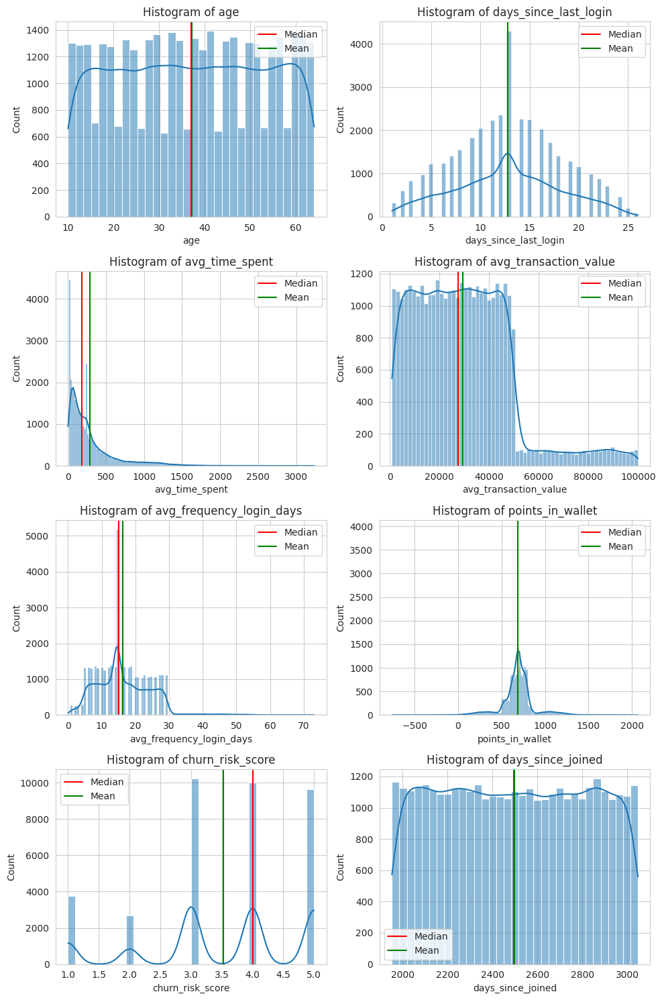

In [ ]:
fig, ax = plt.subplots(numerical_cols.shape[0], numerical_cols.shape[1], figsize = (10, 15))

for i in range(numerical_cols.shape[0]):
    for j in range(numerical_cols.shape[1]):
        if numerical_cols[i, j] == '':
            continue
        sns.histplot(data = preprocess_df, x = numerical_cols[i, j], ax = ax[i, j], kde = True)
        ax[i, j].set_title('Histogram of ' + numerical_cols[i,j])
        ax[i, j].axvline(x = preprocess_df[numerical_cols[i, j]].median(), color = 'red', label = 'Median')
        ax[i, j].axvline(x = preprocess_df[numerical_cols[i, j]].mean(), color = 'green', label = 'Mean')
        ax[i, j].legend()

plt.tight_layout()
plt.show()

avg_time_spent, avg_transaction_value, avg_frequency_login_days really skewed right very much, I will experiment on feature transformation to handle it

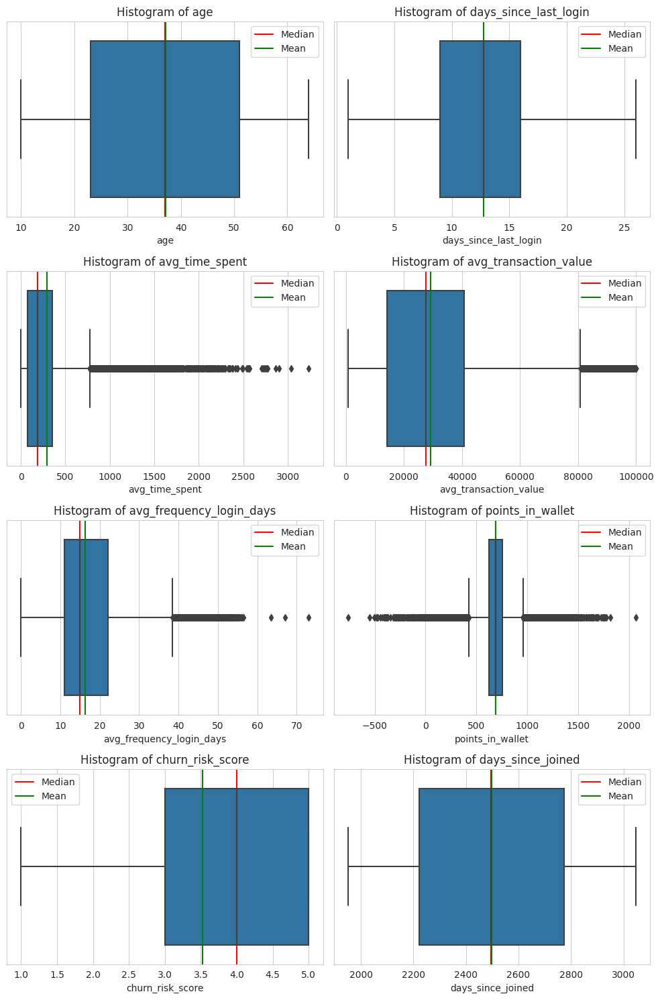

In [ ]:
# select numerical columns and set it with shape correspond to subplots
fig, ax = plt.subplots(numerical_cols.shape[0], numerical_cols.shape[1], figsize = (10, 15))

for i in range(numerical_cols.shape[0]):
    for j in range(numerical_cols.shape[1]):
        if numerical_cols[i, j] == '':
            continue
        sns.boxplot(data = preprocess_df, x = numerical_cols[i, j], ax = ax[i, j])
        ax[i, j].set_title('Histogram of ' + numerical_cols[i,j])
        ax[i, j].axvline(x = preprocess_df[numerical_cols[i, j]].median(), color = 'red', label = 'Median')
        ax[i, j].axvline(x = preprocess_df[numerical_cols[i, j]].mean(), color = 'green', label = 'Mean')
        ax[i, j].legend()

plt.tight_layout()
plt.show()

avg_time_spent, avg_transaction_value, avg_frequency_login_days, points_in_wallet really have a lots outliers and it occupy very much in data so I will impute it

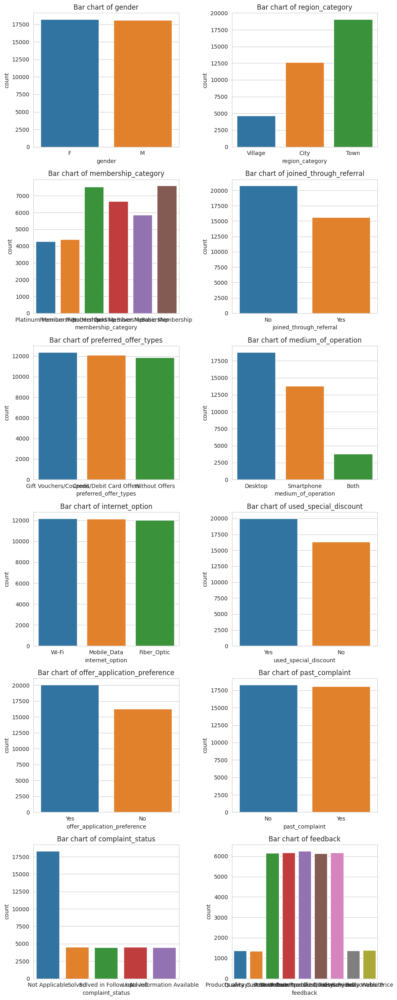

In [ ]:
fig, ax = plt.subplots(categorical_cols.shape[0], categorical_cols.shape[1], figsize = (10,25))

for i in range(categorical_cols.shape[0]):
    for j in range(categorical_cols.shape[1]):
        if categorical_cols[i, j] == '':
            continue
        sns.countplot(data = preprocess_df, x = categorical_cols[i,j], ax = ax[i, j])
        ax[i, j].set_title('Bar chart of ' + categorical_cols[i,j])

plt.tight_layout()
plt.show()

I dont wanna analyze bivariate variable =)) If you wanna take a small look you can pair plot it

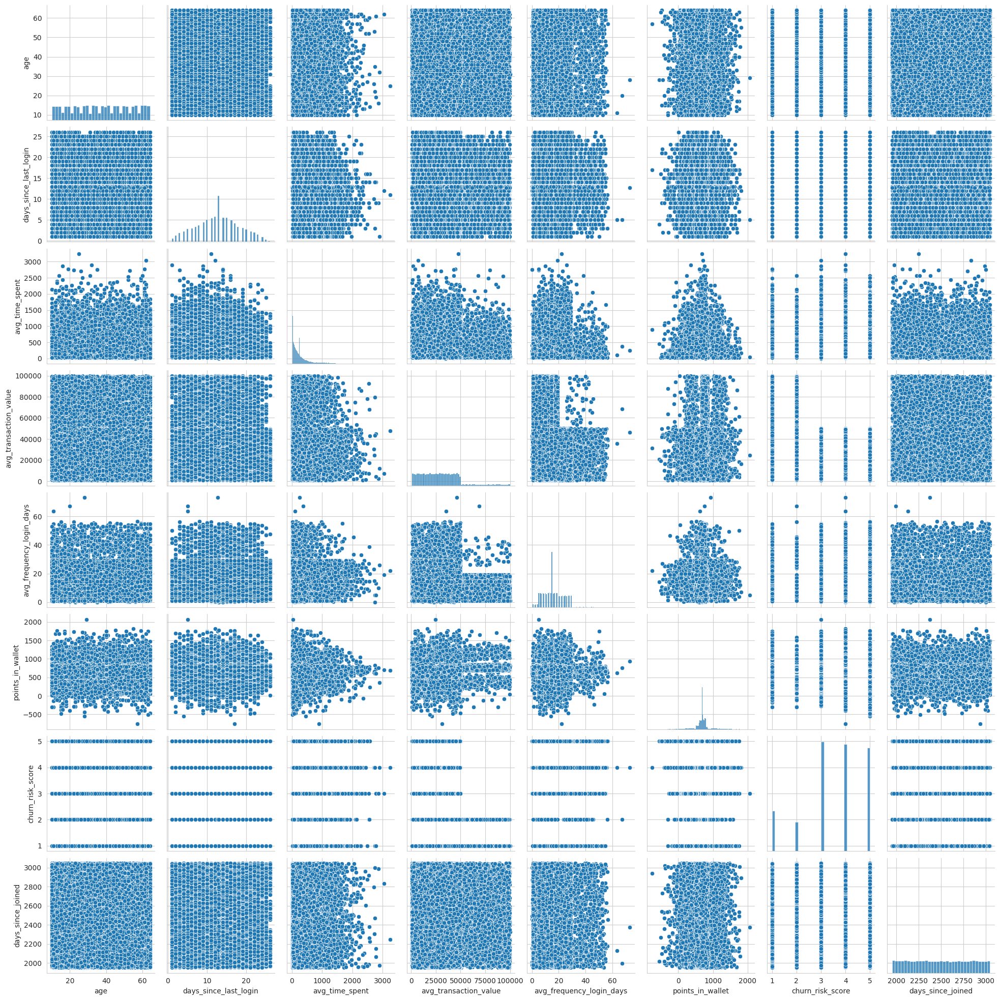

In [ ]:
sns.set_style('whitegrid')
sns.pairplot(preprocess_df)
plt.show()

In [ ]:
preprocess_df['churn_risk_score'].value_counts()

3    10235
4    10004
5     9655
1     3760
2     2703
Name: churn_risk_score, dtype: int64

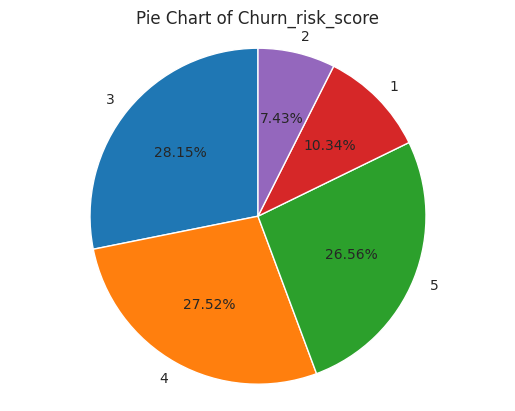

In [ ]:
label_target = preprocess_df['churn_risk_score'].value_counts().index.to_list()

plt.pie(preprocess_df['churn_risk_score'].value_counts(), labels=label_target, autopct='%.2f%%', startangle=90)
plt.axis('equal')
plt.title('Pie Chart of Churn_risk_score')
plt.show()

<ipython-input-296-0e7aefc3fc4d>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(preprocess_df.corr(), annot=True, linewidth=.5, fmt=".2f", cmap = 'icefire')


<Axes: >

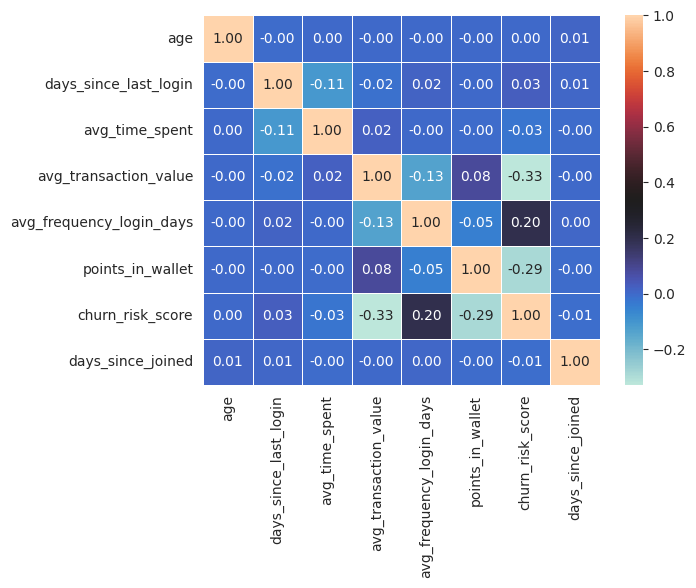

In [ ]:
sns.heatmap(preprocess_df.corr(), annot=True, linewidth=.5, fmt=".2f", cmap = 'icefire')

# Feature Engineering

## Handling Outlier

In [19]:
fe = preprocess_df.copy()

In [6]:
def remove_outlier(data, feature, lower_bound, upper_bound):
    Q1 = data[feature].quantile(lower_bound) # or Q1 = np.percentile(df['column'], 0.25)
    Q3 = data[feature].quantile(upper_bound)
    IQR = Q3 - Q1
    lower_extreme = Q1 - 1.5*IQR
    upper_extreme = Q3 + 1.5*IQR

    outliers = data[(data[feature] < lower_extreme) | (data[feature] > upper_extreme)]
    percent_outliers = len(outliers) / len(data) * 100
    print('Percent of outlier in',feature,':',percent_outliers)

    data = data.drop(outliers.index)

    return data

def imputate_outlier(data, feature, lower_bound, upper_bound):
    Q1 = data[feature].quantile(lower_bound) # or Q1 = np.percentile(df['column'], lower_bound)
    Q3 = data[feature].quantile(upper_bound)
    IQR = Q3 - Q1
    lower_extreme = Q1 - 1.5*IQR
    upper_extreme = Q3 + 1.5*IQR

    outliers = data[(data[feature] < lower_extreme) | (data[feature] > upper_extreme)]
    percent_outliers = len(outliers) / len(data) * 100
    print('Percent of outlier in',feature,':',percent_outliers)
    
    mean = data[feature].median() # median = df['column'].median()
    data.loc[df[feature] < lower_extreme, feature] = Q1 # or mean
    data.loc[df[feature] > upper_extreme, feature] = Q3 # or mean

    return data

cause avg_transaction_value and avg_frequency_login_days have small outliers so I will drop outliers then impute avg_time_spent and points_in_wallet

In [20]:
fe = remove_outlier(fe, 'avg_transaction_value', 0.25, 0.75)

fe = remove_outlier(fe, 'avg_frequency_login_days', 0.25, 0.75)

fe = remove_outlier(fe, 'avg_time_spent', 0.25, 0.75)

fe = remove_outlier(fe, 'points_in_wallet', 0.25, 0.75)

Percent of outlier in avg_transaction_value : 3.058558186869104
Percent of outlier in avg_frequency_login_days : 1.2994751028514682
Percent of outlier in avg_time_spent : 8.753269899675166
Percent of outlier in points_in_wallet : 13.001701216054439


## Encoding

One-hot encoding work not good as label encoding for all feature even most of theme are nominal but it lead to high-dimension (even I tuning PCA in cross-validation) so I use label encoding for all feature

In [21]:
from sklearn.preprocessing import LabelEncoder 
Encoder = LabelEncoder()
# fe['membership_category'] = Encoder.fit_transform(fe['membership_category'])
for i in categorical_cols.flatten().tolist():
    fe[i] = Encoder.fit_transform(fe[i])

In [ ]:
# nominal_encode = categorical_cols.flatten()
# nominal_encode = np.delete(nominal_encode, 2) # 2 as index if membership_category
# nominal_encode

array(['gender', 'region_category', 'joined_through_referral',
       'preferred_offer_types', 'medium_of_operation', 'internet_option',
       'used_special_discount', 'offer_application_preference',
       'past_complaint', 'complaint_status', 'feedback'], dtype='<U28')

In [ ]:
# fe = pd.get_dummies(fe, prefix=nominal_encode, columns=nominal_encode)
# fe

## Feature transformation

avg_time_spent, avg_transaction_value, avg_frequency_login_days

In [22]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method = 'box-cox')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [23]:
fe['avg_time_spent'] = scaler.fit_transform(fe['avg_time_spent'].values.reshape(-1, 1))
fe['avg_transaction_value'] = scaler.fit_transform(fe['avg_transaction_value'].values.reshape(-1, 1))
fe['avg_frequency_login_days'] = scaler.fit_transform(fe['avg_frequency_login_days'].values.reshape(-1, 1))

array([[<Axes: title={'center': 'avg_time_spent'}>,
        <Axes: title={'center': 'avg_transaction_value'}>],
       [<Axes: title={'center': 'avg_frequency_login_days'}>, <Axes: >]],
      dtype=object)

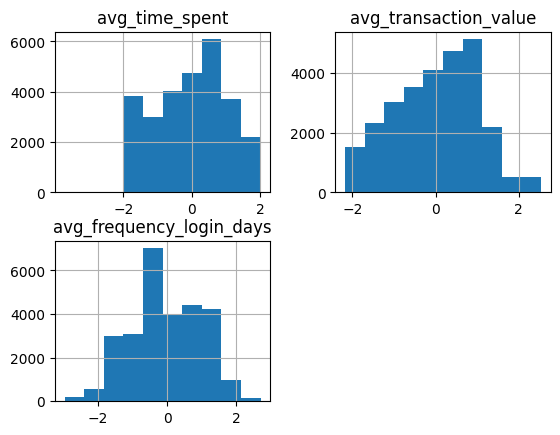

In [ ]:
skewed_features = ['avg_time_spent','avg_transaction_value','avg_frequency_login_days']
fe[skewed_features].hist()

## Feature Selection

In [24]:
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
X = fe.drop(['churn_risk_score'], axis = 1)
Y = fe['churn_risk_score']

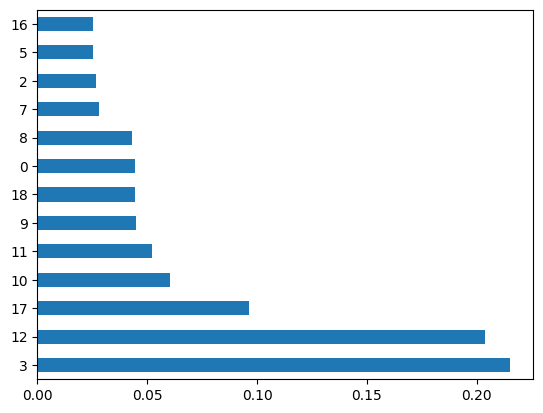

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier(n_estimators=100)
model.fit(X, Y)
# print(model.feature_importances_)
f_importance = pd.DataFrame({'Feature_Name': X.columns, 'Weight_Importance': model.feature_importances_})
feat = pd.Series(model.feature_importances_)
feat = feat.reindex(range(len(feat)))
feat.nlargest(13).plot(kind = 'barh')
plt.show()

In [ ]:
f_importance_sorted = f_importance.sort_values(by='Weight_Importance', ascending=False)
f_importance_sorted = f_importance_sorted.reset_index(drop=True)
f_importance_sorted

,Feature_Name,Weight_Importance
0,membership_category,0.215127
1,points_in_wallet,0.203907
2,feedback,0.096127
3,avg_transaction_value,0.060211
4,avg_frequency_login_days,0.052246
5,avg_time_spent,0.044771
6,days_since_joined,0.044478
7,age,0.044375
8,days_since_last_login,0.043274
9,internet_option,0.028220


<Axes: >

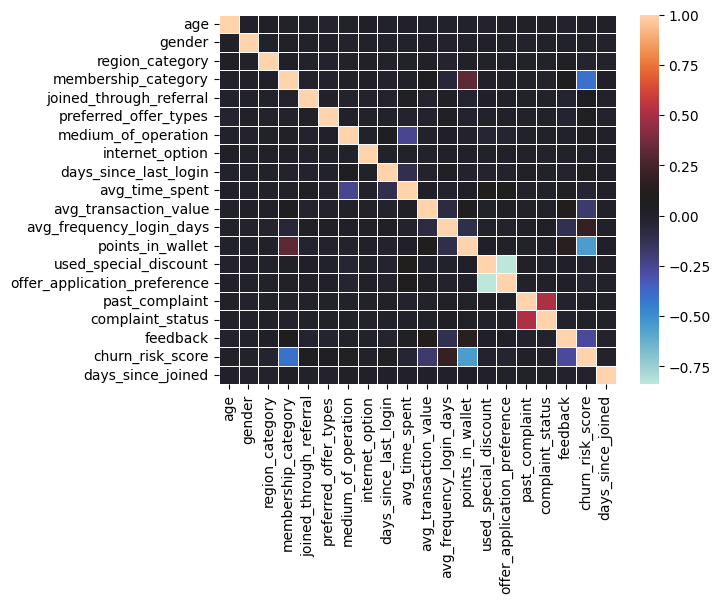

In [ ]:
sns.heatmap(fe.corr(), linewidth=.5, cmap = 'icefire')

# Apply machine learning model

In [ ]:
!pip install catboost

In [10]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier  #objective="multi:softprob"
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

In [11]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, \
                        confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA

def evaluate_model(y_true, y_pred):
    """
    :param y_true: ground truth values
    :param y_pred: predictions
    """
    print("accuracy", accuracy_score(y_true, y_pred))
    print("precision", precision_score(y_true, y_pred, average = 'weighted'))
    print("recall", recall_score(y_true, y_pred, average = 'weighted'))
    print("F1", f1_score(y_true, y_pred, average = 'weighted'))
    # print("ROC_AUC ", roc_auc_score(y_true, y_pred, average = 'weighted'))

    report = classification_report(y_true, y_pred)
    print("Classification Report\n",report)

    cm = confusion_matrix(y_true,y_pred)
	# tn, fp, fn, tp = confusion_matrix(test_labels, y_pred).ravel()
    display_label = np.unique(y_true)
    cm_display = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = display_label)
    cm_display.plot()
    plt.show()
    
    compare_df = pd.DataFrame({'Actual': y_true, 'Predict': y_pred})
    print(compare_df)

In [15]:
numerical_f = numerical_cols.flatten().tolist()
numerical_f.remove('churn_risk_score')

def kfold_save_model(model_chosen, X, y, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state = 42)
    best_score = 0
    best_dataset = None
    for i, (train_index, test_index) in enumerate(kf.split(X)):
        print(f'Fold {i+1}th in total {n_splits} Fold')
        X_train, X_test = X.iloc[train_index,:], X.iloc[test_index,:]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Standardize numerical data train and test 
        scaler = StandardScaler()
        X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
        X_test[numerical_f] = scaler.transform(X_test[numerical_f])

        # Build model with Data train
        model = model_chosen(X_train, y_train)

        # Evaluate
        y_pred = model.predict(X_test)
        score = recall_score(y_test, y_pred, average = 'weighted')
        # score = model.score(X_test, y_test)

        # save best model and data train with best score
        if score > best_score:
            best_score = score
            best_dataset = (X_train, X_test, y_train, y_test)
            best_model = model
    
    # Train your best model using the best dataset (X_train, y_train) and return the trained model
    print('Taking best model with best data train')
    X_train_best, _, y_train_best, _ = best_dataset
    best_model.fit(X_train_best, y_train_best)
    print("Best parameter (CV score=%0.3f):" % model.best_score_)
    print(model.best_params_)   
    
    return best_model, best_dataset

##  Decision Tree Classifier

In [ ]:
def build_model_DecisionTree(X, y):

    pipe = Pipeline(steps=[("tree", DecisionTreeClassifier(random_state = 42))], verbose = True) 
    param_grid = {
        'tree__criterion': ['gini','entropy','log_loss'],
        'tree__splitter': ['best','random'],
        'tree__max_features': [None, 'auto', 'sqrt', 'log2']
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 3)
    model.fit(X, y)

    return model

In [ ]:
%%time
model, dataset = kfold_save_model(build_model_DecisionTree, X, Y, 5)

X_train, X_test, Y_train, Y_test = dataset
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

Fold 1th in total 5 Fold


<ipython-input-325-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-325-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan na

[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.5s
Fold 2th in total 5 Fold


<ipython-input-325-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-325-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan na

[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.8s
Fold 3th in total 5 Fold


<ipython-input-325-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-325-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan na

[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.5s
Fold 4th in total 5 Fold


<ipython-input-325-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-325-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan na

[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.5s
Fold 5th in total 5 Fold


<ipython-input-325-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-325-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan na

[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.5s
Taking best model with best data train


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan]
  warnings.warn(


[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.5s
Best parameter (CV score=nan):
{'tree__criterion': 'gini', 'tree__max_features': None, 'tree__splitter': 'best'}
CPU times: user 9.01 s, sys: 949 ms, total: 9.96 s
Wall time: 1min 51s


((27830, 44), (6957, 44), (27830,), (6957,))

accuracy 0.7309184993531694
precision 0.7280017606314646
recall 0.7309184993531694
F1 0.729069374204585
Classification Report
               precision    recall  f1-score   support

           1       0.55      0.46      0.50       694
           2       0.73      0.75      0.74       418
           3       0.87      0.89      0.88      2005
           4       0.65      0.66      0.66      1969
           5       0.72      0.73      0.73      1871

    accuracy                           0.73      6957
   macro avg       0.70      0.70      0.70      6957
weighted avg       0.73      0.73      0.73      6957



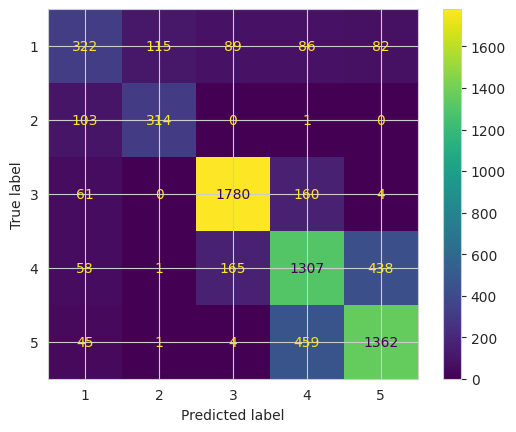

       Actual  Predict
9           4        4
16          5        5
24          5        4
25          3        3
40          3        3
...       ...      ...
36958       3        3
36974       4        4
36976       4        4
36979       1        2
36991       2        2

[6957 rows x 2 columns]


In [ ]:
y_pred = model.predict(X_test)

evaluate_model(y_pred, Y_test)

In [ ]:
y_pred = model.predict(X_train)
evaluate_model(y_pred, Y_train)

Drop all missing and error value + one-hot encode for nominal category (Dataset will have shape 18k x 45)

accuracy 0.7885146327995582
precision 0.7902183535015855
recall 0.7885146327995582
F1 0.7888957548355046
Classification Report
               precision    recall  f1-score   support

           1       0.67      0.78      0.72       240
           2       0.81      0.73      0.77       314
           3       0.92      0.92      0.92      1066
           4       0.68      0.69      0.69       982
           5       0.78      0.77      0.77      1020

    accuracy                           0.79      3622
   macro avg       0.77      0.78      0.77      3622
weighted avg       0.79      0.79      0.79      3622



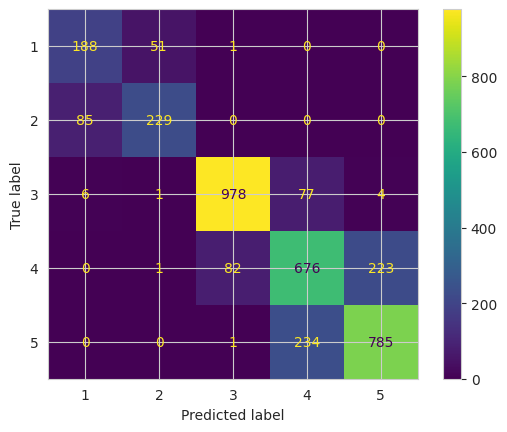

       Actual  Predict
3           5        5
4           4        5
43          1        1
57          3        3
59          3        3
...       ...      ...
36967       4        4
36976       4        4
36977       4        5
36983       5        5
36985       2        2

[3622 rows x 2 columns]


In [ ]:
y_pred = model.predict(X_test)

evaluate_model(y_pred, Y_test)

accuracy 1.0
precision 1.0
recall 1.0
F1 1.0
Classification Report
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      1082
           2       1.00      1.00      1.00      1128
           3       1.00      1.00      1.00      4211
           4       1.00      1.00      1.00      4161
           5       1.00      1.00      1.00      3909

    accuracy                           1.00     14491
   macro avg       1.00      1.00      1.00     14491
weighted avg       1.00      1.00      1.00     14491



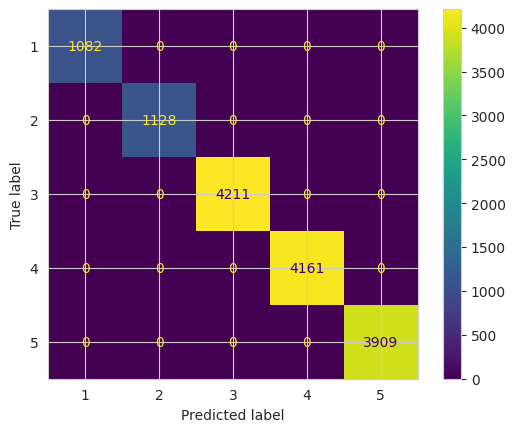

       Actual  Predict
2           5        5
6           3        3
10          5        5
11          3        3
12          4        4
...       ...      ...
36979       2        2
36984       1        1
36986       3        3
36988       5        5
36990       3        3

[14491 rows x 2 columns]


In [ ]:
y_pred = model.predict(X_train)
evaluate_model(y_pred, Y_train)

## Random Forest

In [ ]:
def build_model_RandomForest(X, y):

    pipe = Pipeline(steps=[ ("tree", RandomForestClassifier(random_state = 42, n_jobs = -1))], verbose = True) 
    # components = np.arange(5, 41, 5)
    param_grid = {
        # "pca__n_components": components,
        'tree__n_estimators': [50, 100, 200],
        'tree__criterion': ['gini','entropy','log_loss'],
        'tree__max_features': [None, 'auto', 'sqrt', 'log2']
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 3)
    model.fit(X, y)

    return model

In [ ]:
%%time
model, dataset = kfold_save_model(build_model_RandomForest, X, Y, 5)

X_train, X_test, Y_train, Y_test = dataset
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

Fold 1th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan 

[Pipeline] .............. (step 1 of 1) Processing tree, total=   4.7s
Fold 2th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan 

[Pipeline] .............. (step 1 of 1) Processing tree, total=   4.6s
Fold 3th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan 

[Pipeline] .............. (step 1 of 1) Processing tree, total=   4.9s
Fold 4th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan 

[Pipeline] .............. (step 1 of 1) Processing tree, total=   4.6s
Fold 5th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan 

[Pipeline] .............. (step 1 of 1) Processing tree, total=   4.6s
Taking best model with best data train


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


[Pipeline] .............. (step 1 of 1) Processing tree, total=   6.2s
Best parameter (CV score=nan):
{'tree__criterion': 'gini', 'tree__max_features': None, 'tree__n_estimators': 50}
CPU times: user 1min 21s, sys: 3.27 s, total: 1min 25s
Wall time: 1h 38min 36s


((22092, 19), (5523, 19), (22092,), (5523,))

accuracy 0.7736737280463516
precision 0.7834253549891483
recall 0.7736737280463516
F1 0.7766972486209488
Classification Report
               precision    recall  f1-score   support

           1       0.60      0.73      0.66       403
           2       0.69      0.83      0.75       282
           3       0.94      0.89      0.91      1773
           4       0.64      0.69      0.67      1427
           5       0.80      0.72      0.76      1638

    accuracy                           0.77      5523
   macro avg       0.73      0.77      0.75      5523
weighted avg       0.78      0.77      0.78      5523



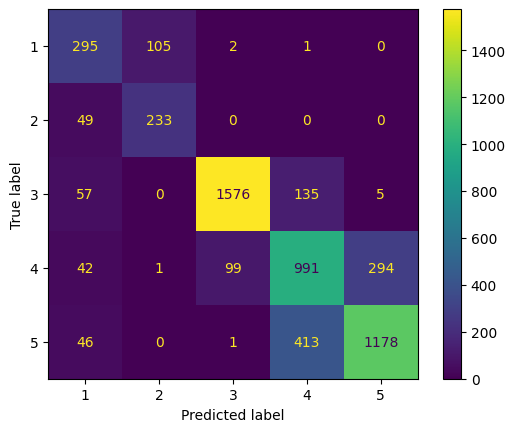

       Actual  Predict
0           1        2
7           5        5
21          5        5
36          5        5
49          3        3
...       ...      ...
36941       5        5
36945       3        3
36948       5        5
36968       2        2
36970       5        4

[5523 rows x 2 columns]


In [ ]:
y_pred = model.predict(X_test)

evaluate_model(y_pred, Y_test)

accuracy 0.9996378779648741
precision 0.9996393043441361
recall 0.9996378779648741
F1 0.999638192518937
Classification Report
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      2023
           2       1.00      1.00      1.00      1352
           3       1.00      1.00      1.00      6384
           4       1.00      1.00      1.00      6191
           5       1.00      1.00      1.00      6142

    accuracy                           1.00     22092
   macro avg       1.00      1.00      1.00     22092
weighted avg       1.00      1.00      1.00     22092



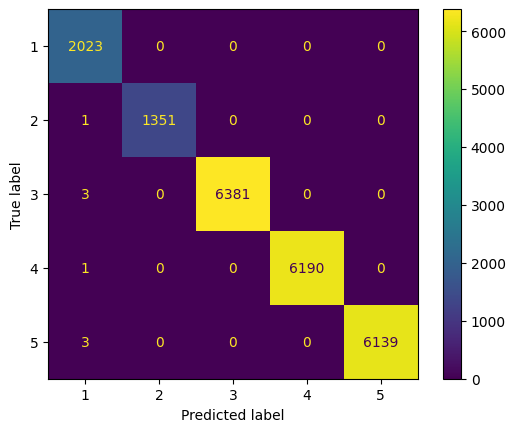

       Actual  Predict
1           1        1
2           5        5
3           5        5
4           5        5
5           3        3
...       ...      ...
36986       3        3
36987       4        4
36988       5        5
36989       4        4
36991       2        2

[22092 rows x 2 columns]


In [ ]:
y_pred = model.predict(X_train)
evaluate_model(y_pred, Y_train)

## Cat Boost

In [ ]:
def build_model_CatBoost(X, y):

    pipe = Pipeline(steps=[("tree", CatBoostClassifier(random_state = 42))], verbose = True) 
    # components = np.arange(5, 41, 5)
    param_grid = {
        # "pca__n_components": components,
        "tree__n_estimators": [50, 100, 200],
        "tree__learning_rate": [1, 1e-3, 1e-6]
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 2)
    model.fit(X, y)

    return model

In [ ]:
%%time
model, dataset = kfold_save_model(build_model_CatBoost, X, Y, 5)

X_train, X_test, Y_train, Y_test = dataset
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

Fold 1th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan]
  warnings.warn(


0:	learn: 0.7872750	total: 64.6ms	remaining: 3.17s
1:	learn: 0.6180984	total: 83.7ms	remaining: 2.01s
2:	learn: 0.5241049	total: 99.2ms	remaining: 1.55s
3:	learn: 0.4855491	total: 113ms	remaining: 1.3s
4:	learn: 0.4757268	total: 125ms	remaining: 1.13s
5:	learn: 0.4652910	total: 138ms	remaining: 1.01s
6:	learn: 0.4620258	total: 150ms	remaining: 921ms
7:	learn: 0.4577408	total: 163ms	remaining: 855ms
8:	learn: 0.4538698	total: 177ms	remaining: 806ms
9:	learn: 0.4499389	total: 191ms	remaining: 763ms
10:	learn: 0.4463218	total: 204ms	remaining: 722ms
11:	learn: 0.4404259	total: 219ms	remaining: 695ms
12:	learn: 0.4374168	total: 233ms	remaining: 664ms
13:	learn: 0.4335289	total: 249ms	remaining: 640ms
14:	learn: 0.4301996	total: 262ms	remaining: 611ms
15:	learn: 0.4287752	total: 276ms	remaining: 586ms
16:	learn: 0.4224632	total: 291ms	remaining: 564ms
17:	learn: 0.4163173	total: 304ms	remaining: 540ms
18:	learn: 0.4137434	total: 319ms	remaining: 520ms
19:	learn: 0.4121370	total: 334ms	remai

<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan]
  warnings.warn(


0:	learn: 0.7878281	total: 15.5ms	remaining: 758ms
1:	learn: 0.6763480	total: 26.7ms	remaining: 640ms
2:	learn: 0.5656346	total: 41.2ms	remaining: 646ms
3:	learn: 0.5202003	total: 55.4ms	remaining: 637ms
4:	learn: 0.5006660	total: 67.5ms	remaining: 607ms
5:	learn: 0.4816592	total: 84.3ms	remaining: 618ms
6:	learn: 0.4766615	total: 96.9ms	remaining: 595ms
7:	learn: 0.4729371	total: 110ms	remaining: 579ms
8:	learn: 0.4692154	total: 123ms	remaining: 562ms
9:	learn: 0.4640176	total: 137ms	remaining: 549ms
10:	learn: 0.4602931	total: 151ms	remaining: 535ms
11:	learn: 0.4524258	total: 164ms	remaining: 518ms
12:	learn: 0.4459170	total: 178ms	remaining: 506ms
13:	learn: 0.4427812	total: 191ms	remaining: 491ms
14:	learn: 0.4395859	total: 203ms	remaining: 473ms
15:	learn: 0.4330828	total: 219ms	remaining: 466ms
16:	learn: 0.4295985	total: 233ms	remaining: 453ms
17:	learn: 0.4273469	total: 246ms	remaining: 436ms
18:	learn: 0.4251069	total: 257ms	remaining: 420ms
19:	learn: 0.4239029	total: 270ms	

<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan]
  warnings.warn(


0:	learn: 0.7889934	total: 31.7ms	remaining: 1.55s
1:	learn: 0.6523961	total: 56.9ms	remaining: 1.37s
2:	learn: 0.5419937	total: 94ms	remaining: 1.47s
3:	learn: 0.5140419	total: 123ms	remaining: 1.41s
4:	learn: 0.4970702	total: 151ms	remaining: 1.36s
5:	learn: 0.4836353	total: 181ms	remaining: 1.32s
6:	learn: 0.4712443	total: 200ms	remaining: 1.23s
7:	learn: 0.4627590	total: 219ms	remaining: 1.15s
8:	learn: 0.4599934	total: 242ms	remaining: 1.1s
9:	learn: 0.4569804	total: 260ms	remaining: 1.04s
10:	learn: 0.4504435	total: 277ms	remaining: 983ms
11:	learn: 0.4471236	total: 296ms	remaining: 937ms
12:	learn: 0.4448407	total: 314ms	remaining: 894ms
13:	learn: 0.4414774	total: 338ms	remaining: 870ms
14:	learn: 0.4396077	total: 366ms	remaining: 853ms
15:	learn: 0.4370114	total: 386ms	remaining: 820ms
16:	learn: 0.4340795	total: 417ms	remaining: 809ms
17:	learn: 0.4318522	total: 450ms	remaining: 800ms
18:	learn: 0.4244602	total: 480ms	remaining: 783ms
19:	learn: 0.4224258	total: 507ms	remaini

<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan]
  warnings.warn(


0:	learn: 0.7837552	total: 13.8ms	remaining: 676ms
1:	learn: 0.6174844	total: 26.6ms	remaining: 639ms
2:	learn: 0.5291568	total: 41.6ms	remaining: 652ms
3:	learn: 0.5079375	total: 55.2ms	remaining: 635ms
4:	learn: 0.5039853	total: 68.3ms	remaining: 615ms
5:	learn: 0.5041607	total: 84.5ms	remaining: 620ms
6:	learn: 0.4801769	total: 97.6ms	remaining: 599ms
7:	learn: 0.4737722	total: 112ms	remaining: 589ms
8:	learn: 0.4640774	total: 125ms	remaining: 569ms
9:	learn: 0.4554200	total: 139ms	remaining: 556ms
10:	learn: 0.4447189	total: 153ms	remaining: 541ms
11:	learn: 0.4418668	total: 166ms	remaining: 526ms
12:	learn: 0.4379656	total: 179ms	remaining: 511ms
13:	learn: 0.4355306	total: 191ms	remaining: 492ms
14:	learn: 0.4340929	total: 203ms	remaining: 473ms
15:	learn: 0.4285637	total: 219ms	remaining: 464ms
16:	learn: 0.4272485	total: 231ms	remaining: 448ms
17:	learn: 0.4229456	total: 245ms	remaining: 436ms
18:	learn: 0.4208928	total: 257ms	remaining: 420ms
19:	learn: 0.4194367	total: 269ms	

<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan]
  warnings.warn(


0:	learn: 0.7875592	total: 13.7ms	remaining: 671ms
1:	learn: 0.6548816	total: 25ms	remaining: 600ms
2:	learn: 0.5476246	total: 39.6ms	remaining: 620ms
3:	learn: 0.5160276	total: 51.5ms	remaining: 593ms
4:	learn: 0.5042624	total: 67.4ms	remaining: 606ms
5:	learn: 0.4843331	total: 86ms	remaining: 630ms
6:	learn: 0.4733699	total: 99.2ms	remaining: 609ms
7:	learn: 0.4676514	total: 113ms	remaining: 595ms
8:	learn: 0.4637209	total: 126ms	remaining: 573ms
9:	learn: 0.4584788	total: 140ms	remaining: 561ms
10:	learn: 0.4545742	total: 154ms	remaining: 547ms
11:	learn: 0.4425497	total: 167ms	remaining: 528ms
12:	learn: 0.4321313	total: 181ms	remaining: 515ms
13:	learn: 0.4291448	total: 197ms	remaining: 508ms
14:	learn: 0.4258229	total: 215ms	remaining: 501ms
15:	learn: 0.4228150	total: 228ms	remaining: 486ms
16:	learn: 0.4203457	total: 241ms	remaining: 467ms
17:	learn: 0.4168239	total: 254ms	remaining: 452ms
18:	learn: 0.4154174	total: 267ms	remaining: 436ms
19:	learn: 0.4135163	total: 280ms	rema

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan]
  warnings.warn(


0:	learn: 0.7878281	total: 16ms	remaining: 785ms
1:	learn: 0.6763480	total: 32.8ms	remaining: 786ms
2:	learn: 0.5656346	total: 48.4ms	remaining: 758ms
3:	learn: 0.5202003	total: 62.8ms	remaining: 722ms
4:	learn: 0.5006660	total: 77.7ms	remaining: 699ms
5:	learn: 0.4816592	total: 91.1ms	remaining: 668ms
6:	learn: 0.4766615	total: 104ms	remaining: 637ms
7:	learn: 0.4729371	total: 117ms	remaining: 616ms
8:	learn: 0.4692154	total: 131ms	remaining: 597ms
9:	learn: 0.4640176	total: 145ms	remaining: 580ms
10:	learn: 0.4602931	total: 158ms	remaining: 561ms
11:	learn: 0.4524258	total: 171ms	remaining: 540ms
12:	learn: 0.4459170	total: 185ms	remaining: 526ms
13:	learn: 0.4427812	total: 198ms	remaining: 509ms
14:	learn: 0.4395859	total: 210ms	remaining: 490ms
15:	learn: 0.4330828	total: 228ms	remaining: 484ms
16:	learn: 0.4295985	total: 242ms	remaining: 469ms
17:	learn: 0.4273469	total: 255ms	remaining: 452ms
18:	learn: 0.4251069	total: 266ms	remaining: 435ms
19:	learn: 0.4239029	total: 279ms	rem

((22092, 19), (5523, 19), (22092,), (5523,))

accuracy 0.7834510229947492
precision 0.7909896378755634
recall 0.7834510229947492
F1 0.7858696489016785
Classification Report
               precision    recall  f1-score   support

           1       0.59      0.75      0.66       387
           2       0.73      0.81      0.77       305
           3       0.94      0.90      0.92      1750
           4       0.67      0.70      0.69      1476
           5       0.80      0.74      0.77      1605

    accuracy                           0.78      5523
   macro avg       0.75      0.78      0.76      5523
weighted avg       0.79      0.78      0.79      5523



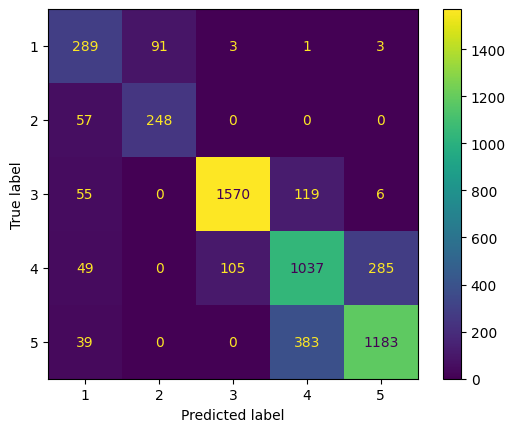

ValueError: ignored

In [ ]:
y_pred = model.predict(X_test)

evaluate_model(y_pred, Y_test)

accuracy 0.8446949121854065
precision 0.8539169149860811
recall 0.8446949121854065
F1 0.8470223408198172
Classification Report
               precision    recall  f1-score   support

           1       0.62      0.86      0.72      1470
           2       0.85      0.89      0.87      1289
           3       0.96      0.93      0.94      6608
           4       0.76      0.80      0.78      5879
           5       0.88      0.79      0.83      6846

    accuracy                           0.84     22092
   macro avg       0.82      0.85      0.83     22092
weighted avg       0.85      0.84      0.85     22092



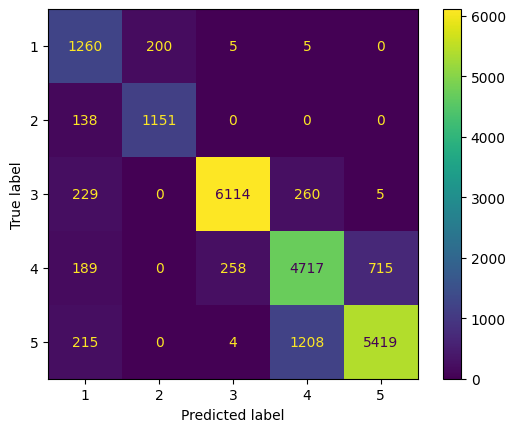

ValueError: ignored

In [ ]:
y_pred = model.predict(X_train)
evaluate_model(y_pred, Y_train)

## Extreme Gradient Boost

In [28]:
def build_model_XGB(X, y):

    pipe = Pipeline(steps=[ ("tree", XGBClassifier(objective="multi:softmax", random_state = 42, n_jobs = -1, booster = 'gbtree'))],\
                    verbose = True) 
    # components = np.arange(5, 41, 5)
    param_grid = {
        # "pca__n_components": components,
        "tree__n_estimators": [50, 100, 200],
        "tree__learning_rate": [1, 1e-3],
        "tree__max_depth": np.arange(3, 11, 1),
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 3)
    model.fit(X, y)

    return model

In [ ]:
%%time
# I use Y-1 for [0, 1, 2, 3, 4] instead [1, 2, 3, 4, 5] cause in XGBClassifier target start from 0
model, dataset = kfold_save_model(build_model_XGB, X, Y-1, 5)

X_train, X_test, Y_train, Y_test = dataset
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

Fold 1th in total 5 Fold


<ipython-input-15-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-15-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])


Without fine-tune

accuracy 0.7867101213108818
precision 0.799398989555192
recall 0.7867101213108818
F1 0.7906369183763594
Classification Report
               precision    recall  f1-score   support

           0       0.56      0.74      0.64       370
           1       0.72      0.77      0.75       315
           2       0.95      0.90      0.92      1773
           3       0.66      0.73      0.69      1396
           4       0.83      0.73      0.78      1669

    accuracy                           0.79      5523
   macro avg       0.74      0.77      0.75      5523
weighted avg       0.80      0.79      0.79      5523



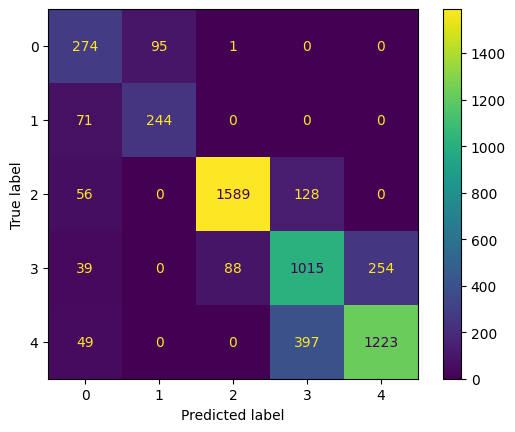

       Actual  Predict
0           0        1
7           4        4
21          4        4
36          4        4
49          2        2
...       ...      ...
36941       4        4
36945       2        2
36948       4        4
36968       1        1
36970       4        3

[5523 rows x 2 columns]


In [ ]:
y_pred = model.predict(X_test)

evaluate_model(y_pred, Y_test)

accuracy 0.9565906210392903
precision 0.9609310719346909
recall 0.9565906210392903
F1 0.9574242093152314
Classification Report
               precision    recall  f1-score   support

           0       0.79      1.00      0.88      1602
           1       1.00      1.00      1.00      1349
           2       1.00      0.98      0.99      6502
           3       0.93      0.96      0.94      6040
           4       0.99      0.92      0.95      6599

    accuracy                           0.96     22092
   macro avg       0.94      0.97      0.95     22092
weighted avg       0.96      0.96      0.96     22092



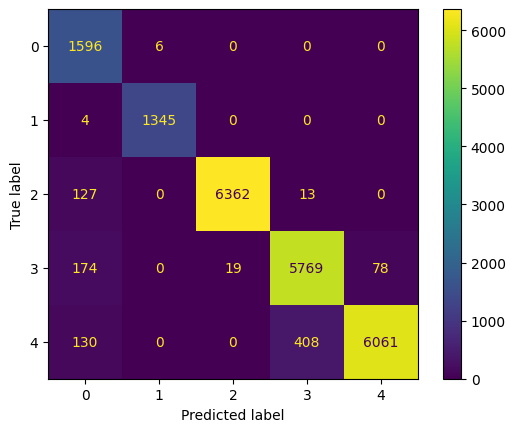

       Actual  Predict
1           0        0
2           4        4
3           4        4
4           4        4
5           2        2
...       ...      ...
36986       2        2
36987       3        3
36988       4        4
36989       3        3
36991       1        1

[22092 rows x 2 columns]


In [ ]:
y_pred = model.predict(X_train)
evaluate_model(y_pred, Y_train)

## Light GBM

In [ ]:
def build_model_LightGBM(X, y):

    pipe = Pipeline(steps=[("tree", LGBMClassifier(objective='multi', random_state = 42, n_jobs = -1))], verbose = True) 
    # components = np.arange(5, 41, 5)
    param_grid = {
        # "pca__n_components": components,
        "tree__boosting_type": ['gbdt', 'dart', 'rf'],
        "tree__learnining_rate": [1, 1e-3, 1e-6],
        "tree__importance_type": ['split', 'gain'],
        "tree__n_estimators": [50, 100, 200]
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 4)
    model.fit(X, y)

    return model

In [ ]:
%%time
model, dataset = kfold_save_model(build_model_LightGBM, X, Y, 5)

X_train, X_test, Y_train, Y_test = dataset
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

Fold 1th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
90 fits failed out of a total of 270.
The score on these train-test partitions for these parameters will be set to nan.

[LightGBM] [Warning] Unknown parameter: learnining_rate
[Pipeline] .............. (step 1 of 1) Processing tree, total=   1.5s
Fold 2th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
90 fits failed out of a total of 270.
The score on these train-test partitions for these parameters will be set to nan.

[LightGBM] [Warning] Unknown parameter: learnining_rate
[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.5s
Fold 3th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
90 fits failed out of a total of 270.
The score on these train-test partitions for these parameters will be set to nan.

[LightGBM] [Warning] Unknown parameter: learnining_rate
[Pipeline] .............. (step 1 of 1) Processing tree, total=   2.2s
Fold 4th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
90 fits failed out of a total of 270.
The score on these train-test partitions for these parameters will be set to nan.

[LightGBM] [Warning] Unknown parameter: learnining_rate
[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.5s
Fold 5th in total 5 Fold


<ipython-input-24-c4504c3e9444>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[numerical_f] = scaler.fit_transform(X_train[numerical_f])
<ipython-input-24-c4504c3e9444>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[numerical_f] = scaler.transform(X_test[numerical_f])
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
90 fits failed out of a total of 270.
The score on these train-test partitions for these parameters will be set to nan.

[LightGBM] [Warning] Unknown parameter: learnining_rate
[Pipeline] .............. (step 1 of 1) Processing tree, total=   1.1s
Taking best model with best data train


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
90 fits failed out of a total of 270.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
90 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 405, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py", line 967, in fit
    super().fit(X, _y, sample_weight=sample_weight, init_score=init_score, eval_

[LightGBM] [Warning] Unknown parameter: learnining_rate
[Pipeline] .............. (step 1 of 1) Processing tree, total=   1.6s
Best parameter (CV score=nan):
{'tree__boosting_type': 'gbdt', 'tree__importance_type': 'split', 'tree__learnining_rate': 1, 'tree__n_estimators': 50}
CPU times: user 28.2 s, sys: 2.16 s, total: 30.3 s
Wall time: 43min 25s


((22092, 19), (5523, 19), (22092,), (5523,))

accuracy 0.7896070975918885
precision 0.8207800156568645
recall 0.7896070975918885
F1 0.7966623861586379
Classification Report
               precision    recall  f1-score   support

           1       0.57      0.74      0.64       375
           2       0.72      0.78      0.75       311
           3       0.95      0.90      0.92      1773
           4       0.59      0.78      0.67      1155
           5       0.91      0.70      0.79      1909

    accuracy                           0.79      5523
   macro avg       0.75      0.78      0.76      5523
weighted avg       0.82      0.79      0.80      5523



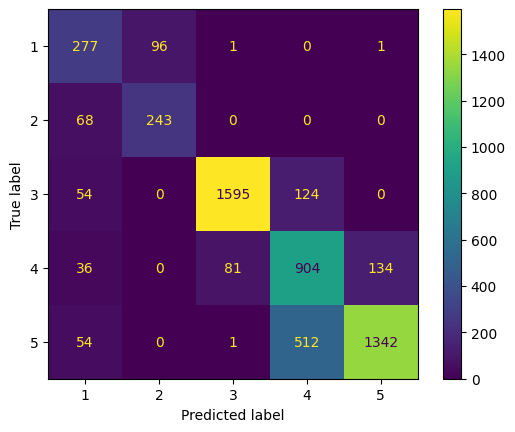

       Actual  Predict
0           1        2
7           5        5
21          5        5
36          5        5
49          3        3
...       ...      ...
36941       5        5
36945       3        3
36948       5        5
36968       2        2
36970       5        4

[5523 rows x 2 columns]


In [ ]:
y_pred = model.predict(X_test)

evaluate_model(y_pred, Y_test)

accuracy 0.8811787072243346
precision 0.9029046673562328
recall 0.8811787072243346
F1 0.8843160683481255
Classification Report
               precision    recall  f1-score   support

           1       0.67      0.95      0.79      1427
           2       0.95      0.98      0.96      1315
           3       0.98      0.94      0.96      6692
           4       0.74      0.91      0.81      4982
           5       0.98      0.78      0.87      7676

    accuracy                           0.88     22092
   macro avg       0.86      0.91      0.88     22092
weighted avg       0.90      0.88      0.88     22092



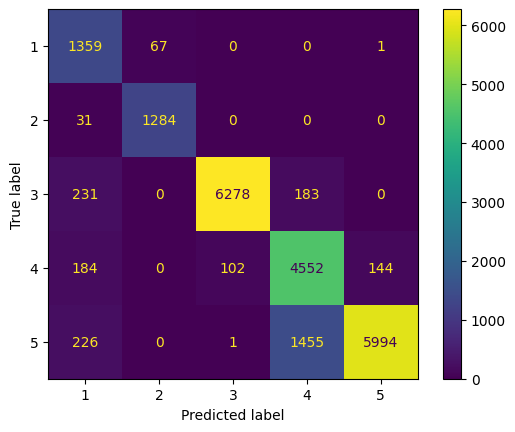

       Actual  Predict
1           1        1
2           5        5
3           5        5
4           5        5
5           3        3
...       ...      ...
36986       3        3
36987       4        4
36988       5        5
36989       5        4
36991       2        2

[22092 rows x 2 columns]


In [ ]:
y_pred = model.predict(X_train)
evaluate_model(y_pred, Y_train)

# Conclusion

Recall is main metric because it's preferable to have a model that does not miss any churns but sometimes classify a non-churns as churns, than a model that does not classify non-churns as churns but misses a lot of churns. In other words, we prefer to be incorrect when classifying a non-churning costumer than when classifying a churning customer.

Light GBM have high performance as RandomForest and XGB, but its not easy to explain classification like them. XGB I haven't done yet so I dont tuning for quick but If we take time for fine-tune XGB it will return high performance

Main model: XGBClassifier. 

Or use RandomForest with Parameters: 
* 'tree__criterion': 'gini'
* 'tree__max_features': None
* 'tree__n_estimators': 50